In [1]:
%run import_libraries.py
hlp = Helper()

# Set the default color cycle
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=['#2ca02c', '#ff7f0e', '#1f77b4']) 

In [2]:
with open('data/preprocessed/data.pickle', 'rb') as file:
    data = pickle.load(file)

## Initial data visualization

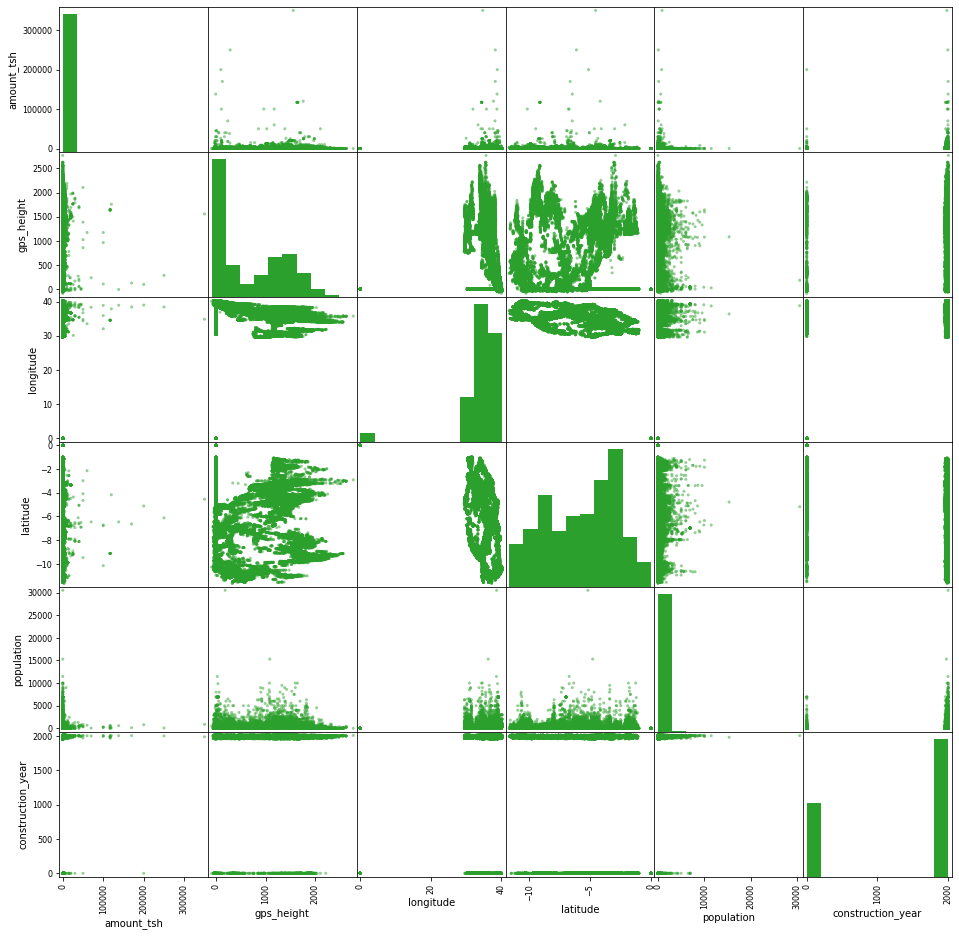

In [3]:
pd.plotting.scatter_matrix(data,figsize=(16,16));

#### Check dependency between labels and `gps_height`

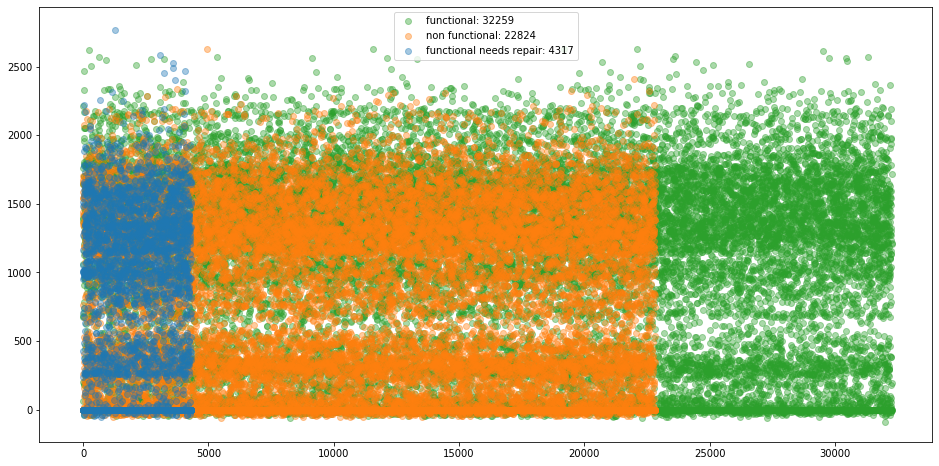

In [4]:
plt.figure(figsize=(16,8))
func = data[data.status_group == 'functional']
plt.scatter(list(range(len(func.gps_height))),func.gps_height, 
            alpha=.4, label='functional: {0}'.format(len(func)))
not_func = data[data.status_group == 'non functional']
plt.scatter(list(range(len(not_func.gps_height))),not_func.gps_height, 
            alpha=.4, label='non functional: {0}'.format(len(not_func)))
need_rep = data[data.status_group == 'functional needs repair']
plt.scatter(list(range(len(need_rep.gps_height))),need_rep.gps_height, 
            alpha=.4, label='functional needs repair: {0}'.format(len(need_rep)))
plt.legend();

No visible dependency between labels and gps_height

No Visible dependency between labels and geographic location on data without construction_year<br>


In [24]:
# plot_df = data[data.longitude != 0]
# no_year = plot_df[plot_df.construction_year == 0]

# px.set_mapbox_access_token('pk.eyJ1IjoidmFkaW1icyIsImEiOiJja240c3R0YXcxa2hxMnFxaXRuNTkwZml2In0.B_CN5t2SEqM4USheUxFNPQ')


# plot_params = dict(
#     lat="latitude", 
#     lon="longitude", 
#     width=960, 
#     height=700, 
#     mapbox_style='streets'
#     labels={"status_group": "Status"},
#     opacity=.7,
#     hover_name='status_group',
#     hover_data=['gps_height','construction_year'],
#     color="status_group", 
#     color_discrete_map={
#         "functional": "#2ca02c",
#         "non functional": "#ff7f0e",
#         "functional needs repair": "#1f77b4",
#     },
#     zoom=5
# )
    
# fig  = px.scatter_mapbox(data[data.status_group == 'functional'], **plot_params)
# fig1 = px.scatter_mapbox(data[data.status_group == 'non functional'], **plot_params)
# fig2 = px.scatter_mapbox(data[data.status_group == 'functional needs repair'], **plot_params)

# fig.add_trace(fig1.data[0])
# fig.add_trace(fig2.data[0])


# fig.update_layout(
#     updatemenus=[
#         dict(
#             y=.96,
#             type="buttons",
#             buttons=list([
#                 dict(label = 'All',
#                     method = 'restyle',
#                     args = [{'visible': [True, True, True]}]),
#                 dict(label = 'Functional',
#                     method = 'restyle',
#                     args = [{'visible': [True, False, False]}]),
#                 dict(label = 'Not functional',
#                     method = 'restyle',
#                     args = [{'visible': [False, True, False]}]),
#                 dict(label = 'Functional needs repair',
#                     method = 'restyle',
#                     args = [{'visible': [False, False,True]}])
#             ]),
#         ),
#         dict(
#             y=.66,
#             x=-.16,
#             type="buttons",
#             buttons=list([
#                 dict(label = 'Map',
#                     method = 'update',
#                     args = [{'mapbox_style': 'outdoors'}]),
#                 dict(label = 'Sattelite',
#                     method = 'update',
#                     args = [{'mapbox_style': 'satellite-streets'}]),
#             ]),
#         )
#     ]
# )

# fig.update_layout(
#     annotations=[
#         dict(text="Pumps status", x=-.25, y=1, showarrow=False),
#         dict(text="Map style", x=-.25, y=.7, showarrow=False),
#     ]
# )

# fig.update_layout(
#     title_text="Water pumps distribution",
#     legend=dict(
#         yanchor="top",
#         y=0.99,
#         xanchor="left",
#         x=0.01),
#     margin=dict(l=20, r=20, t=40, b=20),
# )

# fig.show()

In [25]:
px.set_mapbox_access_token('pk.eyJ1IjoidmFkaW1icyIsImEiOiJja240c3R0YXcxa2hxMnFxaXRuNTkwZml2In0.B_CN5t2SEqM4USheUxFNPQ')

fig = px.scatter_mapbox(
    data, 
    lat="latitude", 
    lon="longitude", 
    width=960, 
    height=700, 
    mapbox_style='streets',#'satellite-streets',
    labels={"status_group": "Status"},
    opacity=.3,
    hover_name='status_group',
    hover_data=['gps_height','construction_year'],
    color="status_group", 
    color_discrete_map={
        "functional": "#2ca02c",
        "non functional": "#ff7f0e",
        "functional needs repair": "#1f77b4",
    },
    zoom=5
)
fig.update_layout(
    title_text="Water pumps distribution",
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01),
    margin=dict(l=0, r=0, t=40, b=0),
)
fig.show()

#### Visualize categorical data distribution

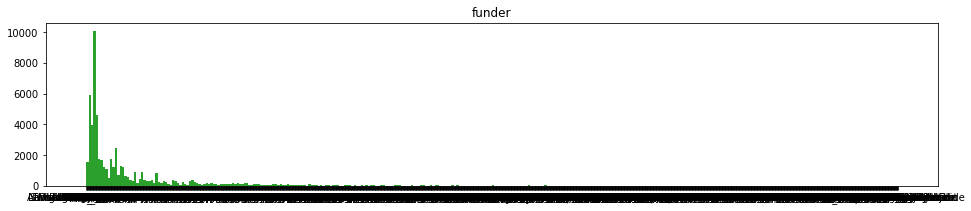

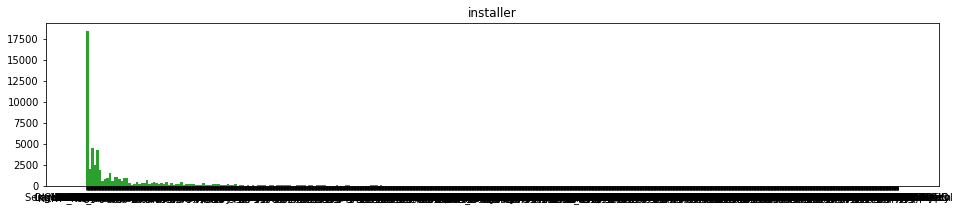

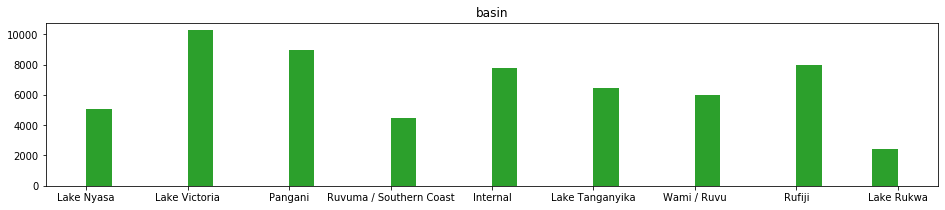

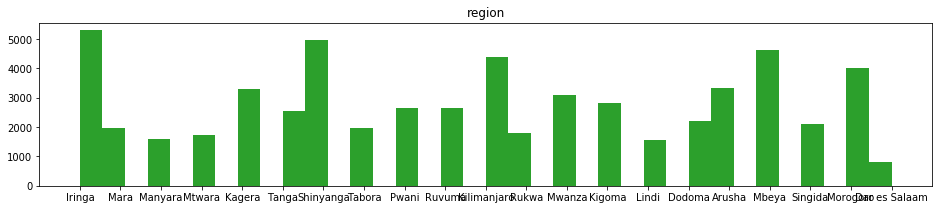

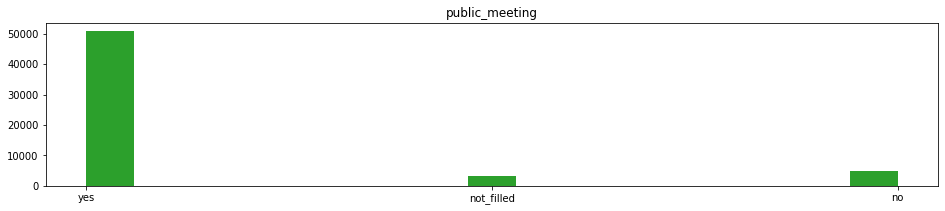

...

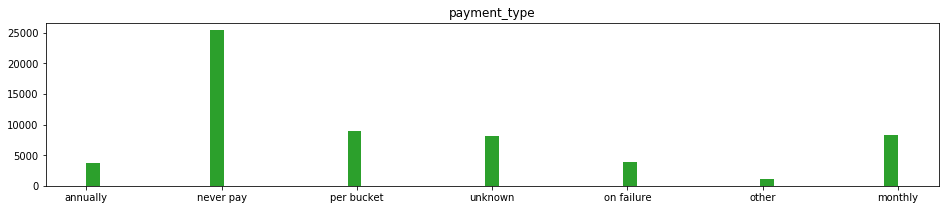

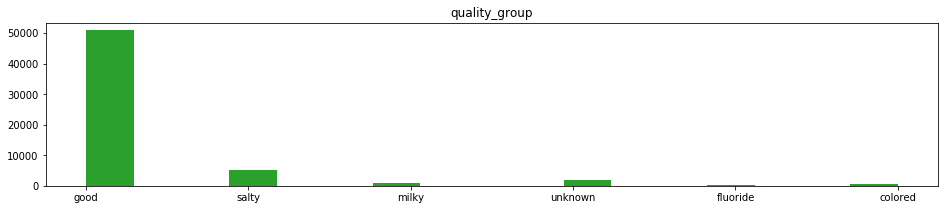

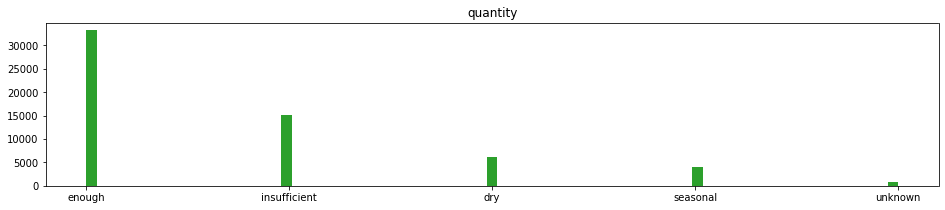

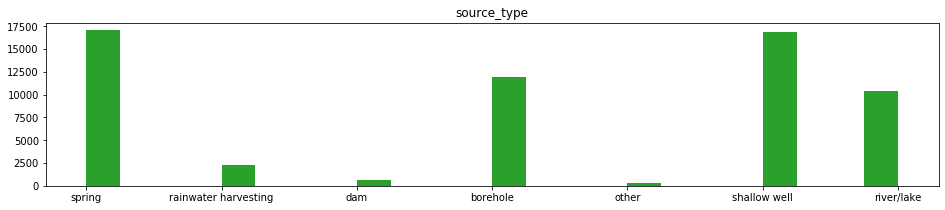

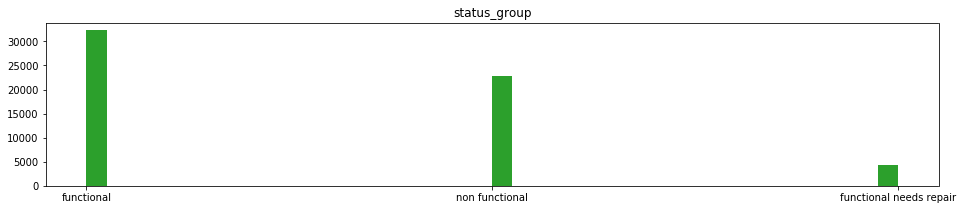

In [7]:
for f in data:
    if data[f].dtype == 'object':
        plt.figure(figsize=(16,3))
        plt.hist(data[f], bins='auto')
        plt.title(f)
        plt.show()

#### Number of waterpoints by operating condition and construction year 

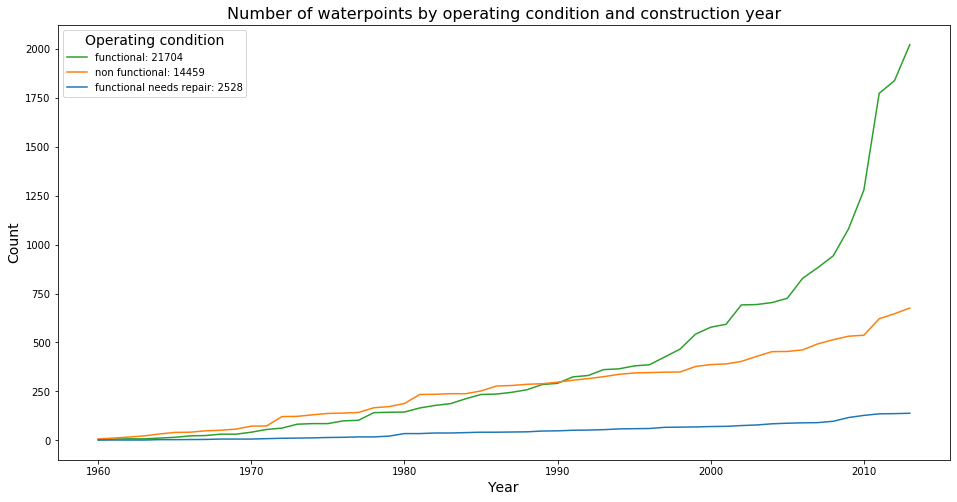

In [8]:
plt.figure(figsize=(16,8))
data_w_year = data[data['construction_year'] > 0]
func = data_w_year[data_w_year['status_group'] == 'functional']
plt.plot(sorted(func.construction_year.unique()),
         sorted(func.groupby('construction_year').status_group.count()), 
         label='functional: {0}'.format(len(func)))

not_func = data_w_year[data_w_year['status_group'] == 'non functional']
plt.plot(sorted(not_func.construction_year.unique()),
         sorted(not_func.groupby('construction_year').status_group.count()), 
         label='non functional: {0}'.format(len(not_func)))

need_rep = data_w_year[data_w_year['status_group'] == 'functional needs repair']
plt.plot(sorted(need_rep.construction_year.unique()),
         sorted(need_rep.groupby('construction_year').status_group.count()), 
         label='functional needs repair: {0}'.format(len(need_rep)))

plt.title('Number of waterpoints by operating condition and construction year',fontsize=16)
plt.xlabel('Year',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.legend(title="Operating condition",title_fontsize=14);

#1f77b4 #ff7f0e #2ca02c

In [9]:
#data.groupby(['payment_type','status_group']).count()

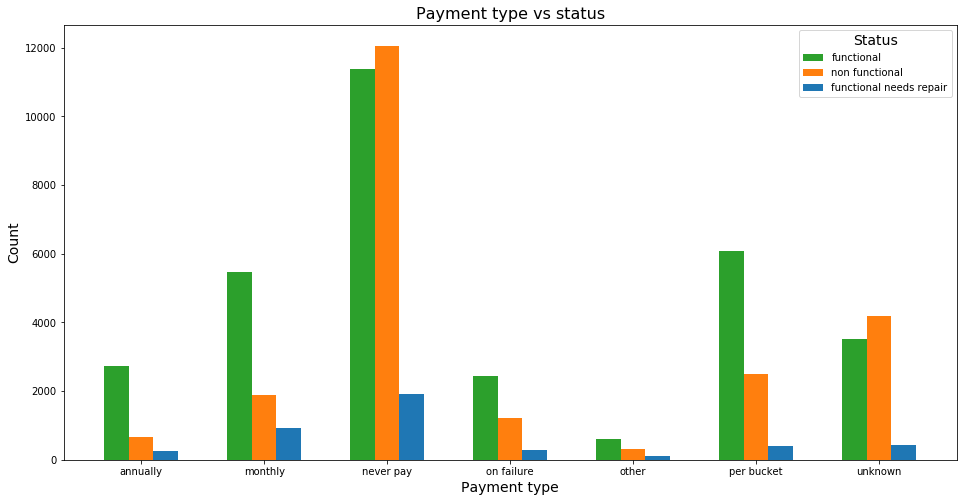

In [10]:
hlp.plot_bar_vs_labels(data,'payment_type','status_group',title='Payment type vs status',
                       xlabel='Payment type',legend_title="Status")

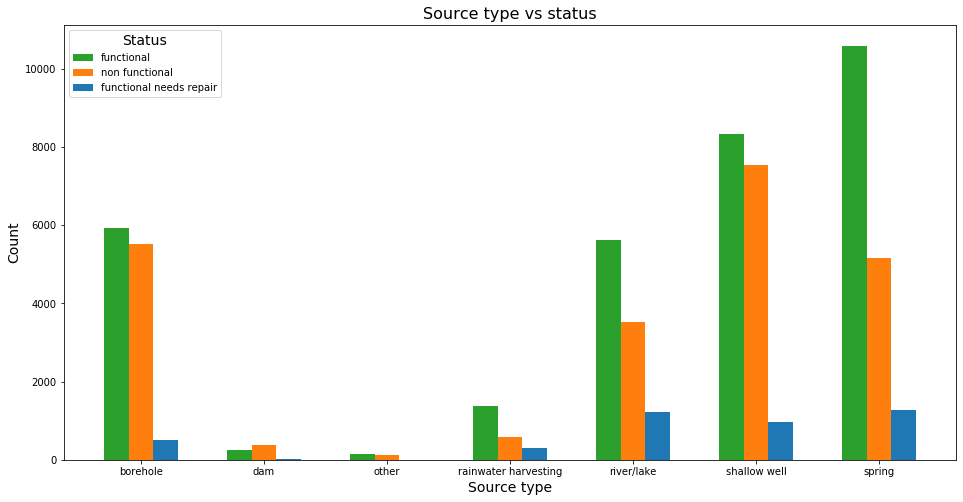

In [11]:
hlp.plot_bar_vs_labels(data,'source_type','status_group',title='Source type vs status',
                   xlabel='Source type',legend_title="Status")

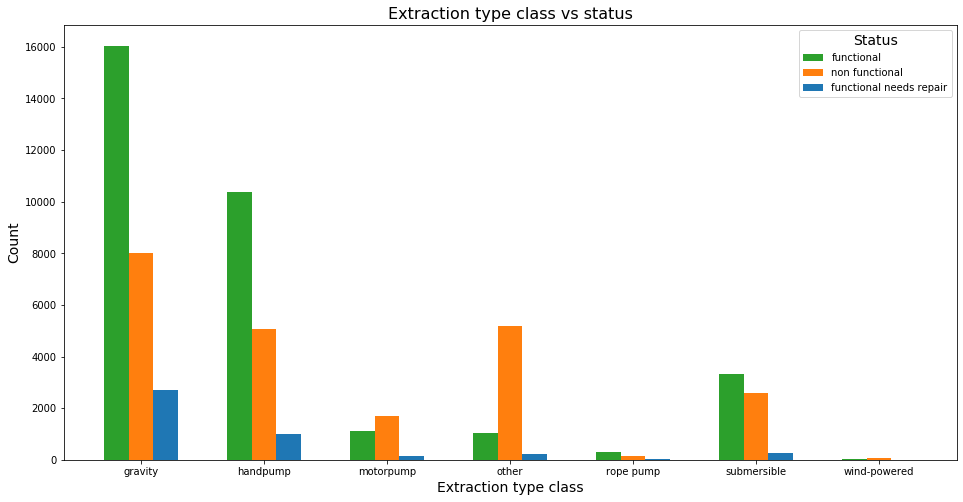

In [12]:
hlp.plot_bar_vs_labels(data,'extraction_type_class','status_group',title='Extraction type class vs status',
                   xlabel='Extraction type class',legend_title="Status")

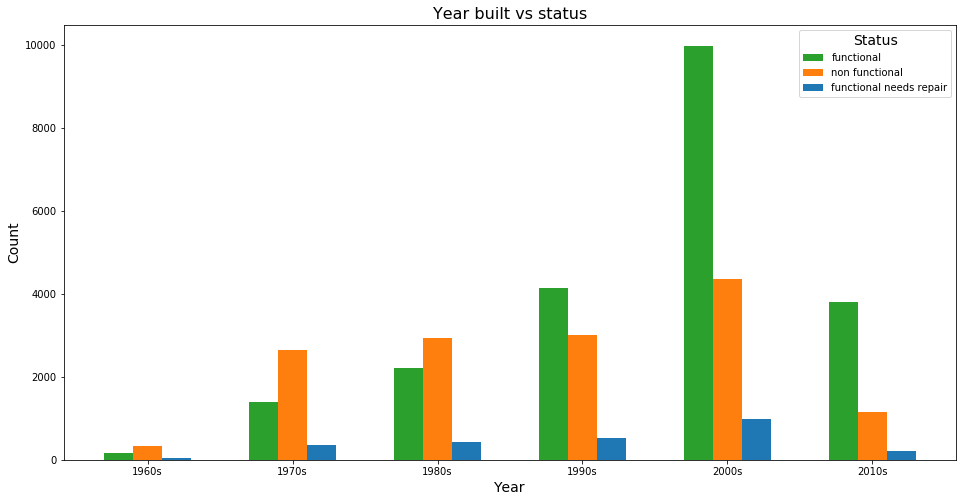

In [13]:
data_no_zero_year = data.copy()
data_no_zero_year = data[data.construction_year != 0]

bins = [1959,1969,1979,1989,1999,2009,2019]
bin_labels = ['1960s','1970s','1980s','1990s','2000s','2010s']
data_no_zero_year['year_int'] = pd.cut(data_no_zero_year['construction_year'], bins=bins, labels=bin_labels)

hlp.plot_bar_vs_labels(data_no_zero_year,'year_int','status_group',title='Year built vs status',
                   xlabel='Year',legend_title="Status")

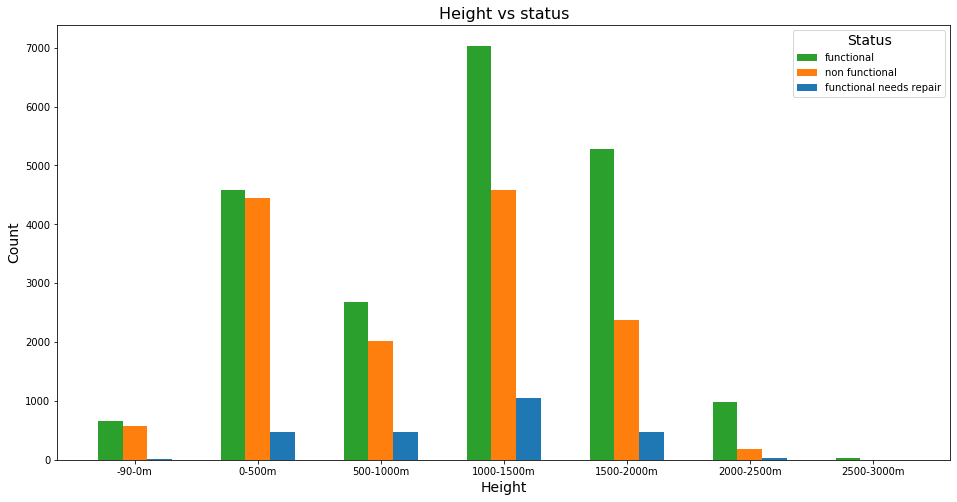

In [14]:
data_no_zero_height = data.copy()
data_no_zero_height = data[data.gps_height != 0]

bins = [-90,0,500,1000,1500,2000,2500,3000]
bin_labels = ['-90-0m','0-500m','500-1000m','1000-1500m','1500-2000m','2000-2500m','2500-3000m']
data_no_zero_year['height_int'] = pd.cut(data_no_zero_height['gps_height'], bins=bins, labels=bin_labels)

hlp.plot_bar_vs_labels(data_no_zero_year,'height_int','status_group',title='Height vs status',
                   xlabel='Height',legend_title="Status")